# Predicting the Likelihood of Customer Churn
Data Source: https://www.kaggle.com/blastchar/telco-customer-churn

## Import Libraries

In [51]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

## Load and Check Data

In [52]:
df = pd.read_csv('churn.csv')
df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [53]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
customerID          7043 non-null object
gender              7043 non-null object
SeniorCitizen       7043 non-null int64
Partner             7043 non-null object
Dependents          7043 non-null object
tenure              7043 non-null int64
PhoneService        7043 non-null object
MultipleLines       7043 non-null object
InternetService     7043 non-null object
OnlineSecurity      7043 non-null object
OnlineBackup        7043 non-null object
DeviceProtection    7043 non-null object
TechSupport         7043 non-null object
StreamingTV         7043 non-null object
StreamingMovies     7043 non-null object
Contract            7043 non-null object
PaperlessBilling    7043 non-null object
PaymentMethod       7043 non-null object
MonthlyCharges      7043 non-null float64
TotalCharges        7043 non-null object
Churn               7043 non-null object
dtypes: float64(1), int64(2), obj

In [54]:
df.isna().sum()

customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

## EDA

***I noticed that one of the variables classified as an object should in fact be a float (TotalCharges) and another variable that was classified as an integer should in fact be an object (SeniorCitizen)***

In [5]:
# We noticed that there were some blank spaces in TotalCharges
len(df[df['TotalCharges'] == " "])

11

In [6]:
# Drop these empty fields
df = df[df['TotalCharges'] != " "]
df['TotalCharges']

0         29.85
1        1889.5
2        108.15
3       1840.75
4        151.65
5         820.5
6        1949.4
7         301.9
8       3046.05
9       3487.95
10       587.45
11        326.8
12       5681.1
13       5036.3
14      2686.05
15      7895.15
16      1022.95
17      7382.25
18       528.35
19       1862.9
20        39.65
21       202.25
22        20.15
23       3505.1
24       2970.3
25       1530.6
26      4749.15
27         30.2
28      6369.45
29       1093.1
30      6766.95
31       181.65
32      1874.45
33         20.2
34        45.25
35       7251.7
36        316.9
37       3548.3
38      3549.25
39       1105.4
40        475.7
41      4872.35
42       418.25
43      4861.45
44       981.45
45       3906.7
46           97
47       144.15
48       4217.8
49       4254.1
50      3838.75
51       1426.4
52      1752.65
53        633.3
54      4456.35
55      1752.55
56       6311.2
57      7076.35
58        894.3
59       7853.7
60       4707.1
61       5450.7
62      

In [7]:
# Let's check if we fixed the issue
len(df[df['TotalCharges'] == " "])

0

In [8]:
df['TotalCharges'] = df['TotalCharges'].astype('float64')

In [9]:
df['SeniorCitizen'] = df['SeniorCitizen'].astype('object')

In [10]:
# Descriptive Summary Statistics
df.describe().transpose().round(2)

,count,mean,std,min,25%,50%,75%,max
tenure,7032.0,32.42,24.55,1.00,9.00,29.00,55.00,72.00
MonthlyCharges,7032.0,64.80,30.09,18.25,35.59,70.35,89.86,118.75
TotalCharges,7032.0,2283.30,2266.77,18.80,401.45,1397.48,3794.74,8684.80


In [11]:
# Checking the balance of the target variable
df['Churn'].value_counts()

No     5163
Yes    1869
Name: Churn, dtype: int64

In [12]:
# Create copy of dataset
df_copy = df.copy()

In [13]:
# Let's drop all numerical colums from our copied dataset
df_copy.drop(['customerID', 'MonthlyCharges', 'TotalCharges', 'tenure'], axis=1, inplace=True)
df_copy.head()

,gender,SeniorCitizen,Partner,Dependents,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,Churn
0,Female,0,Yes,No,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,No
1,Male,0,No,No,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,No
2,Male,0,No,No,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,Yes
3,Male,0,No,No,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),No
4,Female,0,No,No,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,Yes


In [14]:
# Let's create a summary table showing the no. of Customers who churned
# based on the categorical variables using pandas crosstab method
summary = pd.concat([pd.crosstab(df_copy[x], df_copy.Churn) 
                     for x in df_copy[:-1]], 
                     keys=df_copy.columns[:-1])
summary

Churn                                         No   Yes
gender           Female                     2544   939
                 Male                       2619   930
SeniorCitizen    0                          4497  1393
                 1                           666   476
Partner          No                         2439  1200
                 Yes                        2724   669
Dependents       No                         3390  1543
                 Yes                        1773   326
PhoneService     No                          510   170
                 Yes                        4653  1699
MultipleLines    No                         2536   849
                 No phone service            510   170
                 Yes                        2117   850
InternetService  DSL                        1957   459
                 Fiber optic                1799  1297
                 No                         1407   113
OnlineSecurity   No                         2036  1461
                 No internet service        1407   113
                 Yes                        1720   295
OnlineBackup     No                         1854  1233
                 No internet service        1407   113
                 Yes                        1902   523
DeviceProtection No                         1883  1211
                 No internet service        1407   113
                 Yes                        1873   545
TechSupport      No                         2026  1446
                 No internet service        1407   113
                 Yes                        1730   310
StreamingTV      No                         1867   942
                 No internet service        1407   113
                 Yes                        1889   814
StreamingMovies  No                         1843   938
                 No internet service        1407   113
                 Yes                        1913   818
Contract         Month-to-month             2220  1655
                 One year                   1306   166
                 Two year                   1637    48
PaperlessBilling No                         2395   469
                 Yes                        2768  1400
PaymentMethod    Bank transfer (automatic)  1284   258
                 Credit card (automatic)    1289   232
                 Electronic check           1294  1071
                 Mailed check               1296   308

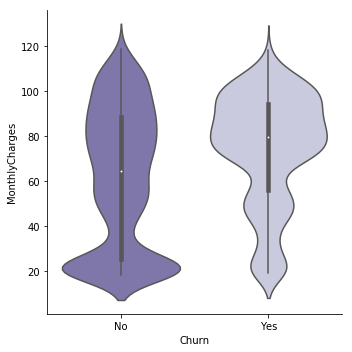

In [15]:
# Let's take look at the differences in distribution between 
# Customers who have churned and those who have not churned
# based on monthly charges.

g = sns.factorplot(x='Churn',
                   y='MonthlyCharges',
                   data=df,
                   kind='violin',
                   palette='Purples_r')
g;

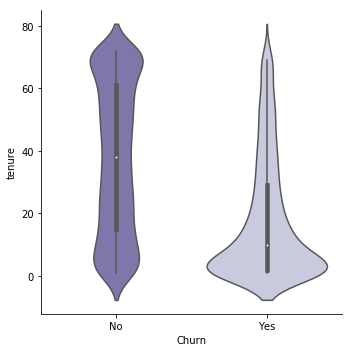

In [16]:
# Let's take look at the differences in distribution between 
# Customers who have churned and those who have not churned
# based on tenure.

g = sns.factorplot(x='Churn',
                   y='tenure',
                   data=df,
                   kind='violin',
                   palette='Purples_r')
g;

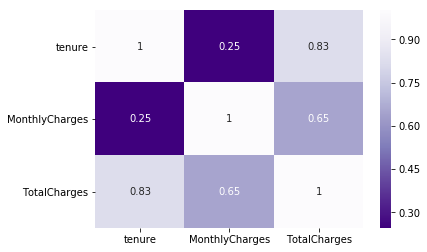

In [17]:
# Let's look at the correlation among these variables
sns.heatmap(df.corr(), annot=True, cmap='Purples_r');

## Feature Engineering
We have two general types of variables: 1) numeric and 2) categorical
For the numeric features, we will apply scikit learn's StandardScaler(), and for the categorical features, we will apply scikit learn's OneHotEncoder to the multi-category variables, and pandas get_dummies function to the binary variables.

In [18]:
# Let's drop customerID because it's not relevant to our model
df = df.drop('customerID', axis=1)
df.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [19]:
df.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [20]:
df.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


### Filter Categorical Variables
A significant portion of our dataset is categorical. Thus, it makes sense to filter these variables and transform them accordingly. We have two types of categorical variables:
1. Multi-category nominal variables
2. Binary nominal variables

We will use scikit learn's OneHotEncoder to treat the multi-category nominal variables, and pandas get_dummies function to treat the binary nominal variables respectively.

In [21]:
cat_vars = df.loc[:,df.dtypes==np.object]
cat_vars.head()

,gender,SeniorCitizen,Partner,Dependents,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,Churn
0,Female,0,Yes,No,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,No
1,Male,0,No,No,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,No
2,Male,0,No,No,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,Yes
3,Male,0,No,No,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),No
4,Female,0,No,No,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,Yes


In [22]:
cat_vars.nunique()

gender              2
SeniorCitizen       2
Partner             2
Dependents          2
PhoneService        2
MultipleLines       3
InternetService     3
OnlineSecurity      3
OnlineBackup        3
DeviceProtection    3
TechSupport         3
StreamingTV         3
StreamingMovies     3
Contract            3
PaperlessBilling    2
PaymentMethod       4
Churn               2
dtype: int64

### Handling Multi-category Nominal Variables

In [23]:
# Keep this
# These are the features with multiple categories
multi_cat = cat_vars.loc[:,cat_vars.nunique() != 2]
multi_cat

,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaymentMethod
0,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Electronic check
1,No,DSL,Yes,No,Yes,No,No,No,One year,Mailed check
2,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Mailed check
3,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,Bank transfer (automatic)
4,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Electronic check
5,Yes,Fiber optic,No,No,Yes,No,Yes,Yes,Month-to-month,Electronic check
6,Yes,Fiber optic,No,Yes,No,No,Yes,No,Month-to-month,Credit card (automatic)
7,No phone service,DSL,Yes,No,No,No,No,No,Month-to-month,Mailed check
8,Yes,Fiber optic,No,No,Yes,Yes,Yes,Yes,Month-to-month,Electronic check
9,No,DSL,Yes,Yes,No,No,No,No,One year,Bank transfer (automatic)


In [24]:
from sklearn.preprocessing import OneHotEncoder

ohe = OneHotEncoder()

ohe.fit(multi_cat)

multi_cat_num = ohe.transform(multi_cat).toarray()

In [25]:
multi_cat.Contract.unique()

array(['Month-to-month', 'One year', 'Two year'], dtype=object)

In [26]:
# Keep this maybe?
multi_cat_num = pd.DataFrame(multi_cat_num, columns=ohe.get_feature_names())
multi_cat_num.head()

,x0_No,x0_No phone service,x0_Yes,x1_DSL,x1_Fiber optic,x1_No,x2_No,x2_No internet service,x2_Yes,x3_No,x3_No internet service,x3_Yes,x4_No,x4_No internet service,x4_Yes,x5_No,x5_No internet service,x5_Yes,x6_No,x6_No internet service,x6_Yes,x7_No,x7_No internet service,x7_Yes,x8_Month-to-month,x8_One year,x8_Two year,x9_Bank transfer (automatic),x9_Credit card (automatic),x9_Electronic check,x9_Mailed check
0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
2,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
4,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0


### Handling Binary Nominal Variables

In [27]:
# Keep this
# These can be converted to numbers using either pandas get_dummies or sklearn LabelEncoder
cat_vars.nunique()[cat_vars.nunique() == 2]

gender              2
SeniorCitizen       2
Partner             2
Dependents          2
PhoneService        2
PaperlessBilling    2
Churn               2
dtype: int64

In [28]:
# Keep this
binary_cat = cat_vars.loc[:,cat_vars.nunique() == 2]
binary_cat

,gender,SeniorCitizen,Partner,Dependents,PhoneService,PaperlessBilling,Churn
0,Female,0,Yes,No,No,Yes,No
1,Male,0,No,No,Yes,No,No
2,Male,0,No,No,Yes,Yes,Yes
3,Male,0,No,No,No,No,No
4,Female,0,No,No,Yes,Yes,Yes
5,Female,0,No,No,Yes,Yes,Yes
6,Male,0,No,Yes,Yes,Yes,No
7,Female,0,No,No,No,No,No
8,Female,0,Yes,No,Yes,Yes,Yes
9,Male,0,No,Yes,Yes,No,No


In [29]:
# Keep this one, save it to a variable and concatenate
binary_cat_num = pd.get_dummies(binary_cat, drop_first=True)
binary_cat_num.head()

,gender_Male,SeniorCitizen_1,Partner_Yes,Dependents_Yes,PhoneService_Yes,PaperlessBilling_Yes,Churn_Yes
0,0,0,1,0,0,1,0
1,1,0,0,0,1,0,0
2,1,0,0,0,1,1,1
3,1,0,0,0,0,0,0
4,0,0,0,0,1,1,1


### Filter Numerical Variables

In [30]:
num_vars = df.loc[:,df.dtypes!=np.object]
num_vars

,tenure,MonthlyCharges,TotalCharges
0,1,29.85,29.85
1,34,56.95,1889.50
2,2,53.85,108.15
3,45,42.30,1840.75
4,2,70.70,151.65
5,8,99.65,820.50
6,22,89.10,1949.40
7,10,29.75,301.90
8,28,104.80,3046.05
9,62,56.15,3487.95


In [31]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()

In [32]:
num_vars_scaled = sc.fit_transform(num_vars)
num_vars_scaled

array([[-1.28024804, -1.16169394, -0.99419409],
       [ 0.06430269, -0.26087792, -0.17373982],
       [-1.23950408, -0.36392329, -0.95964911],
       ...,
       [-0.87280842, -1.17000405, -0.85451414],
       [-1.15801615,  0.31916782, -0.87209546],
       [ 1.36810945,  1.35793167,  2.01234407]])

In [33]:
num_vars.columns

Index(['tenure', 'MonthlyCharges', 'TotalCharges'], dtype='object')

In [34]:
num_vars_scaled = pd.DataFrame(num_vars_scaled, columns=num_vars.columns)
num_vars_scaled

,tenure,MonthlyCharges,TotalCharges
0,-1.280248,-1.161694,-9.941941e-01
1,0.064303,-0.260878,-1.737398e-01
2,-1.239504,-0.363923,-9.596491e-01
3,0.512486,-0.747850,-1.952477e-01
4,-1.239504,0.196178,-9.404575e-01
5,-0.995040,1.158489,-6.453692e-01
6,-0.424625,0.807802,-1.473127e-01
7,-0.913552,-1.165018,-8.741690e-01
8,-0.180161,1.329677,3.365155e-01
9,1.205134,-0.287470,5.314763e-01


### Concatenate num_vars_scaled, multi_cat_num and binary_cat_num

In [35]:
merged_df = pd.concat([num_vars_scaled, multi_cat_num, binary_cat_num], axis=1)
merged_df.head()

,tenure,MonthlyCharges,TotalCharges,x0_No,x0_No phone service,x0_Yes,x1_DSL,x1_Fiber optic,x1_No,x2_No,x2_No internet service,x2_Yes,x3_No,x3_No internet service,x3_Yes,x4_No,x4_No internet service,x4_Yes,x5_No,x5_No internet service,x5_Yes,x6_No,x6_No internet service,x6_Yes,x7_No,x7_No internet service,x7_Yes,x8_Month-to-month,x8_One year,x8_Two year,x9_Bank transfer (automatic),x9_Credit card (automatic),x9_Electronic check,x9_Mailed check,gender_Male,SeniorCitizen_1,Partner_Yes,Dependents_Yes,PhoneService_Yes,PaperlessBilling_Yes,Churn_Yes
0,-1.280248,-1.161694,-0.994194,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
1,0.064303,-0.260878,-0.173740,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
2,-1.239504,-0.363923,-0.959649,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0
3,0.512486,-0.747850,-0.195248,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,-1.239504,0.196178,-0.940457,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0


In [36]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 41 columns):
tenure                          7032 non-null float64
MonthlyCharges                  7032 non-null float64
TotalCharges                    7032 non-null float64
x0_No                           7032 non-null float64
x0_No phone service             7032 non-null float64
x0_Yes                          7032 non-null float64
x1_DSL                          7032 non-null float64
x1_Fiber optic                  7032 non-null float64
x1_No                           7032 non-null float64
x2_No                           7032 non-null float64
x2_No internet service          7032 non-null float64
x2_Yes                          7032 non-null float64
x3_No                           7032 non-null float64
x3_No internet service          7032 non-null float64
x3_Yes                          7032 non-null float64
x4_No                           7032 non-null float64
x4_No internet service       

# Model Training

In [37]:
merged_df = merged_df.dropna()

In [38]:
# Split Data into X & y
X = merged_df.drop('Churn_Yes', axis=1)
y = merged_df['Churn_Yes']

In [39]:
# Import Train Test Split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=101)

### Model #1: Logistic Regression

In [40]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

In [41]:
# Fit Model
lr = LogisticRegression()
log_reg_model = lr.fit(X_train, y_train)

In [42]:
# Generate Predictions & score
log_reg_pred = log_reg_model.predict(X_test)
log_reg_score = log_reg_model.score(X_test, y_test)
log_reg_score

0.7480427046263345

In [43]:
print(confusion_matrix(y_test, log_reg_pred))

[[1001   36]
 [ 318   50]]


In [44]:
print(classification_report(y_test, log_reg_pred))

              precision    recall  f1-score   support

         0.0       0.76      0.97      0.85      1037
         1.0       0.58      0.14      0.22       368

    accuracy                           0.75      1405
   macro avg       0.67      0.55      0.54      1405
weighted avg       0.71      0.75      0.68      1405



### Model #2: Random Forest

In [45]:
from sklearn.ensemble import RandomForestClassifier


model_rf = RandomForestClassifier()
model_rf.fit(X_train, y_train)

predictions = model_rf.predict(X_test)
score = model_rf.score(X_test, y_test)

print("Accuracy = " + str(score))
print(confusion_matrix(y_test, predictions))
print(classification_report(y_test, predictions))

Accuracy = 0.7338078291814947
[[957  80]
 [294  74]]
              precision    recall  f1-score   support

         0.0       0.76      0.92      0.84      1037
         1.0       0.48      0.20      0.28       368

    accuracy                           0.73      1405
   macro avg       0.62      0.56      0.56      1405
weighted avg       0.69      0.73      0.69      1405



### Model #3: AdaBoost Classifier

In [46]:
from sklearn.ensemble import AdaBoostClassifier

model_ab = AdaBoostClassifier()
model_ab.fit(X_train, y_train)

predictions = model_ab.predict(X_test)
score = model_ab.score(X_test, y_test)

print("Accuracy = " + str(score))
print(confusion_matrix(y_test, predictions))
print(classification_report(y_test, predictions))

Accuracy = 0.7437722419928826
[[991  46]
 [314  54]]
              precision    recall  f1-score   support

         0.0       0.76      0.96      0.85      1037
         1.0       0.54      0.15      0.23       368

    accuracy                           0.74      1405
   macro avg       0.65      0.55      0.54      1405
weighted avg       0.70      0.74      0.69      1405



### Model #4: XGBoost

In [47]:
from xgboost import XGBClassifier

model_xgb = XGBClassifier()
model_xgb.fit(X_train, y_train)

predictions = model_xgb.predict(X_test)
score = model_xgb.score(X_test, y_test)

print("Accuracy = " + str(score))
print(confusion_matrix(y_test, predictions))
print(classification_report(y_test, predictions))

[13:06:20] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Accuracy = 0.7096085409252669
[[907 130]
 [278  90]]
              precision    recall  f1-score   support

         0.0       0.77      0.87      0.82      1037
         1.0       0.41      0.24      0.31       368

    accuracy                           0.71      1405
   macro avg       0.59      0.56      0.56      1405
weighted avg       0.67      0.71      0.68      1405



## Reduce Feature Space using PCA

In [48]:
from sklearn.decomposition import PCA
pca = PCA(n_components=0.95)
X_train_reduced = pca.fit_transform(X_train)
X_test_reduced = pca.transform(X_test)
X_train_reduced

array([[ 1.37634777,  1.71259602,  1.86079905, ..., -0.04996983,
        -0.28175559, -0.47800781],
       [-3.1467622 ,  1.09440506, -0.5632914 , ...,  0.18322838,
         0.2688388 , -0.33302253],
       [-0.40837232, -2.07583236, -0.24487664, ..., -0.79032537,
        -0.41916547, -0.50095329],
       ...,
       [-0.50511079, -2.22349207, -0.80102301, ..., -0.06587345,
        -0.1708364 ,  0.05739558],
       [-0.20253004, -1.08231085,  1.05975188, ...,  0.96618887,
        -0.49501436,  0.04887718],
       [ 3.18500236,  1.37116589, -0.79908024, ..., -0.5306842 ,
         0.35229558, -0.35478305]])

In [49]:
pca.explained_variance_ratio_

array([0.31014757, 0.19613299, 0.07127638, 0.04245095, 0.03351856,
       0.03228063, 0.02923747, 0.02850365, 0.02616241, 0.02457897,
       0.02421396, 0.02305686, 0.02136689, 0.02082253, 0.0204952 ,
       0.01999797, 0.01726419, 0.014178  ])

In [50]:
from xgboost import XGBClassifier

model_xgb = XGBClassifier()
model_xgb.fit(X_train_reduced, y_train)

predictions = model_xgb.predict(X_test_reduced)
score = model_xgb.score(X_test_reduced, y_test)

print("Accuracy = " + str(score))
print(confusion_matrix(y_test, predictions))
print(classification_report(y_test, predictions))

[13:06:22] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Accuracy = 0.7160142348754448
[[922 115]
 [284  84]]
              precision    recall  f1-score   support

         0.0       0.76      0.89      0.82      1037
         1.0       0.42      0.23      0.30       368

    accuracy                           0.72      1405
   macro avg       0.59      0.56      0.56      1405
weighted avg       0.67      0.72      0.68      1405

